In [614]:
from datetime import datetime, date, timedelta
import functools
from types import MappingProxyType

import numpy as np
import pandas as pd
import json
from scipy import interpolate
import seaborn as sns; sns.set()
import pathlib
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString
from shapely.ops import nearest_points
from scipy.interpolate import InterpolatedUnivariateSpline
from sklearn.linear_model import RANSACRegressor
from shapely.ops import nearest_points
from abc import ABC, abstractmethod, abstractproperty
from sklearn.cluster import DBSCAN
from matplotlib import pyplot as plt

plt.ioff()

pd.set_option("display.max_columns", 1000)

# Maximum rows - Use this careful
pd.set_option("display.max_rows", 1000)

pd.set_option("display.max_colwidth", 100)
pd.set_option("display.float_format", "{:,.6f}".format)

# List files name contains bus info
list_bus_info_file_names = [
    "stops.json", "paths.json",
    "vars.json", "trips.json", "timetables.json",
    "routes.json"
]

PREDICTION_PATH = r"/data/ebms/feed/prediction"
PREDICTION_COLUMN_HEADERS = (
    "REQUESTTIME", "STOPID", "ROUTEID", 
    "ROUTEVARID", "BUSID", "LOCTIMESTAMP", 
    "DISTANCE", "SPEED",
    "TIMETOSTOP", "UNAMED",
)
BUSINFO_PATH = r"/data/ebms/feed/businfo"
DATE_TO_LOAD = "20200316"  # Date to analysis

In [617]:
# Load source code
%run ../notebook/func_nb.ipynb

Get bus info.
Get data from /data/ebms/feed/businfo/2020/03/16/routes.json
Get data from /data/ebms/feed/businfo/2020/03/16/timetables.json
Get data from /data/ebms/feed/businfo/2020/03/16/trips.json
Get data from /data/ebms/feed/businfo/2020/03/16/vars.json
Get data from /data/ebms/feed/businfo/2020/03/16/paths.json
Get data from /data/ebms/feed/businfo/2020/03/16/stops.json
Get log data.
/data/ebms/feed/prediction/2020_03_16.csv
Ranking stops sequences.
Get Ratio distance for each stops.


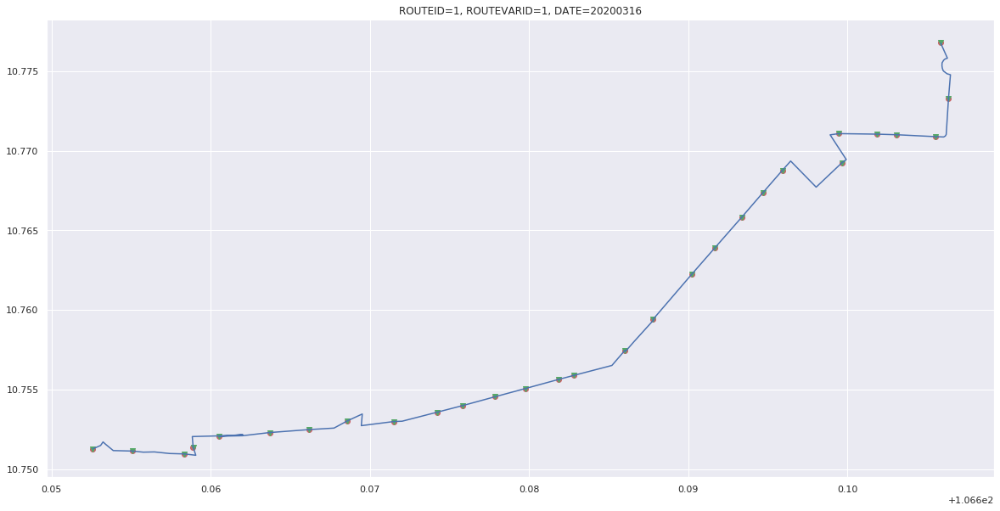

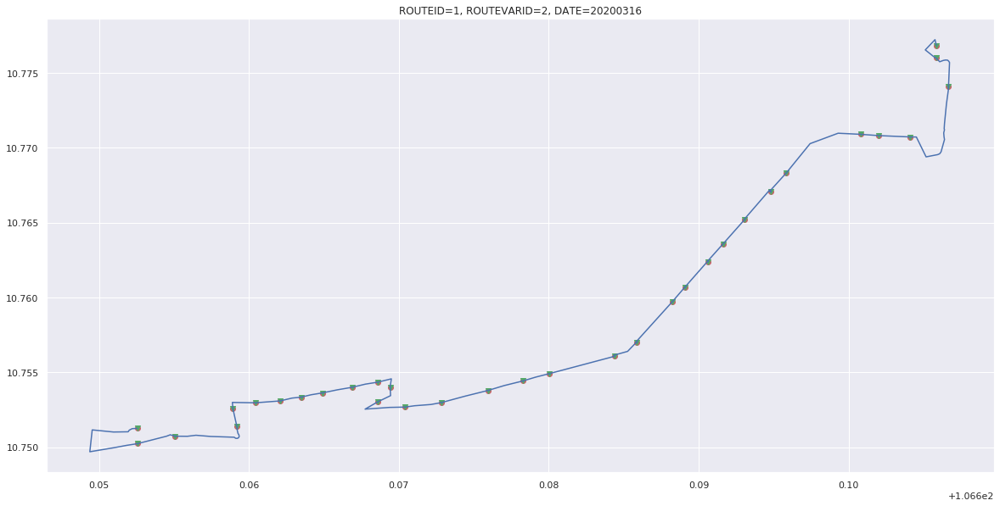

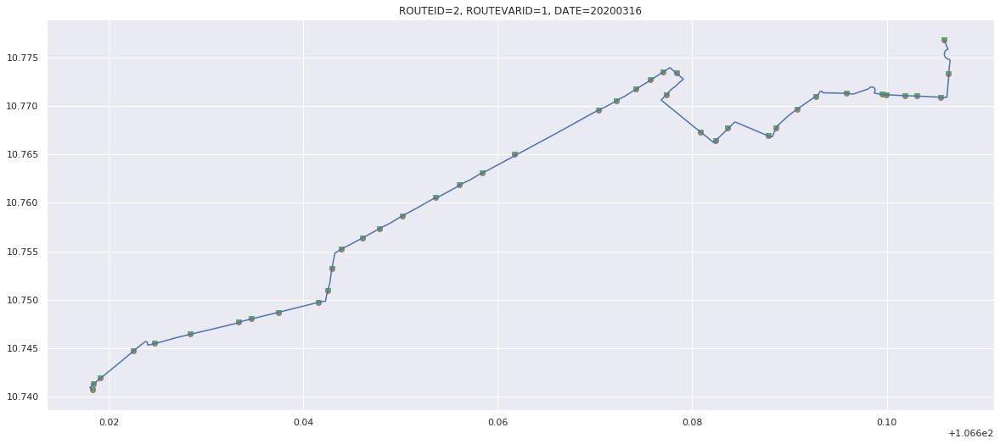

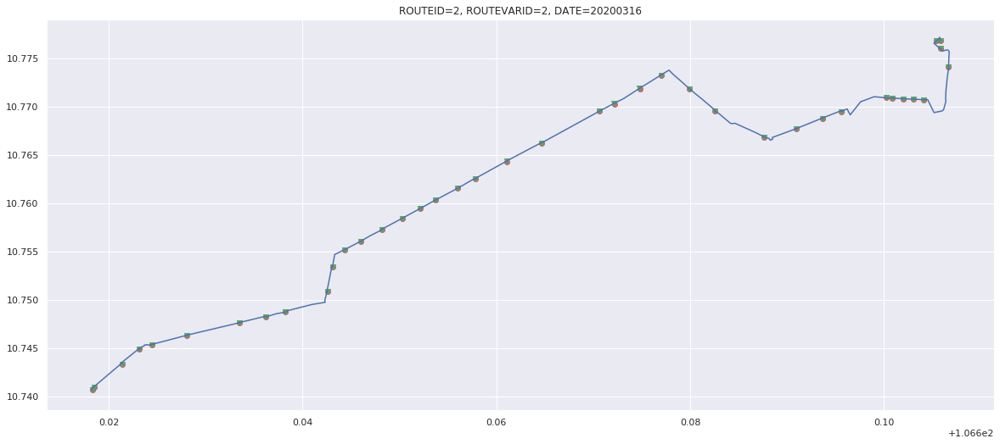

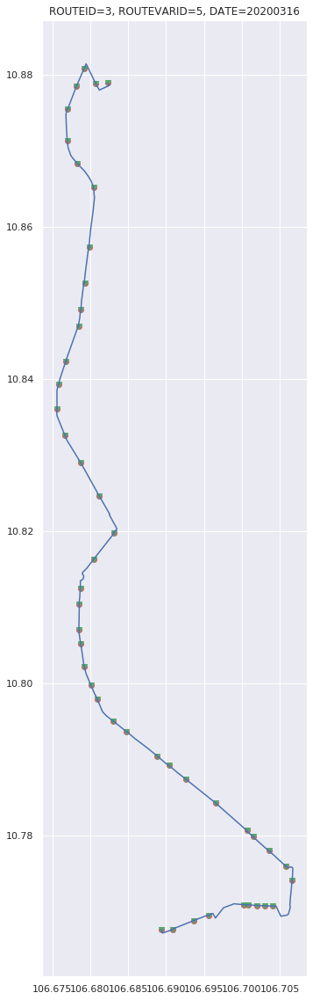

...

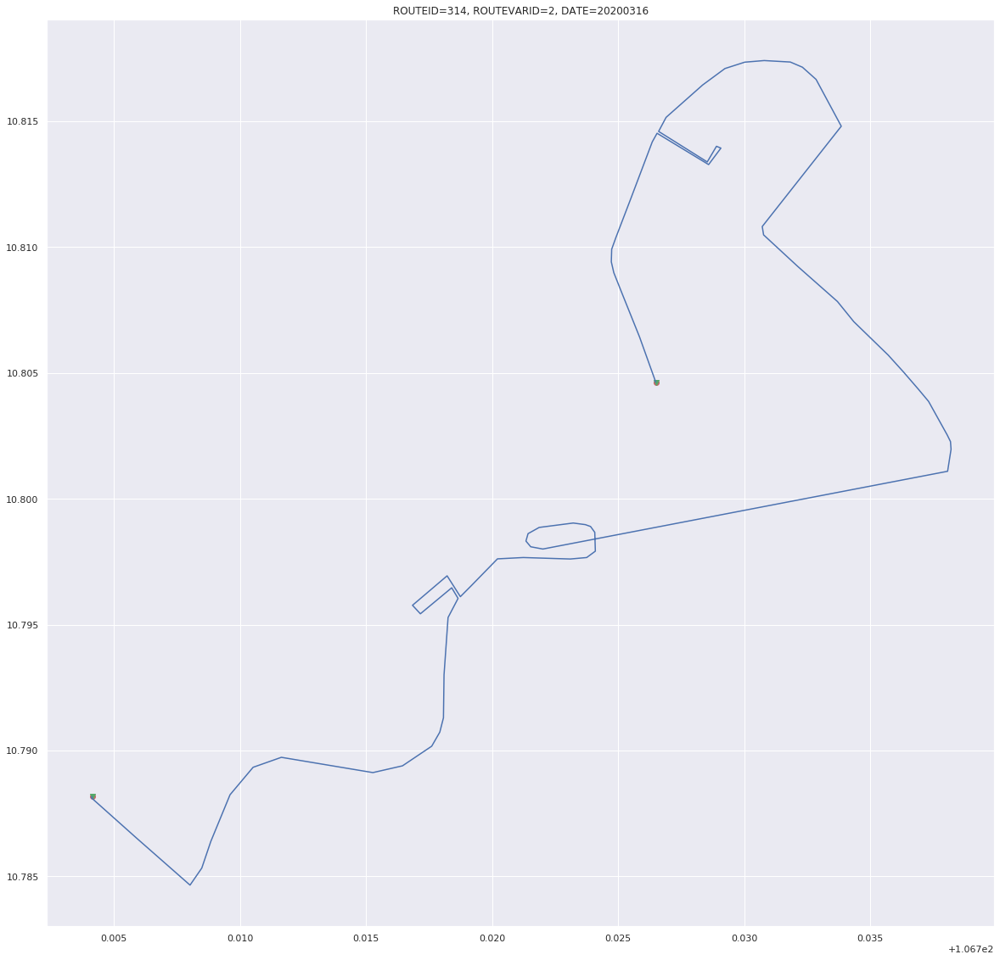

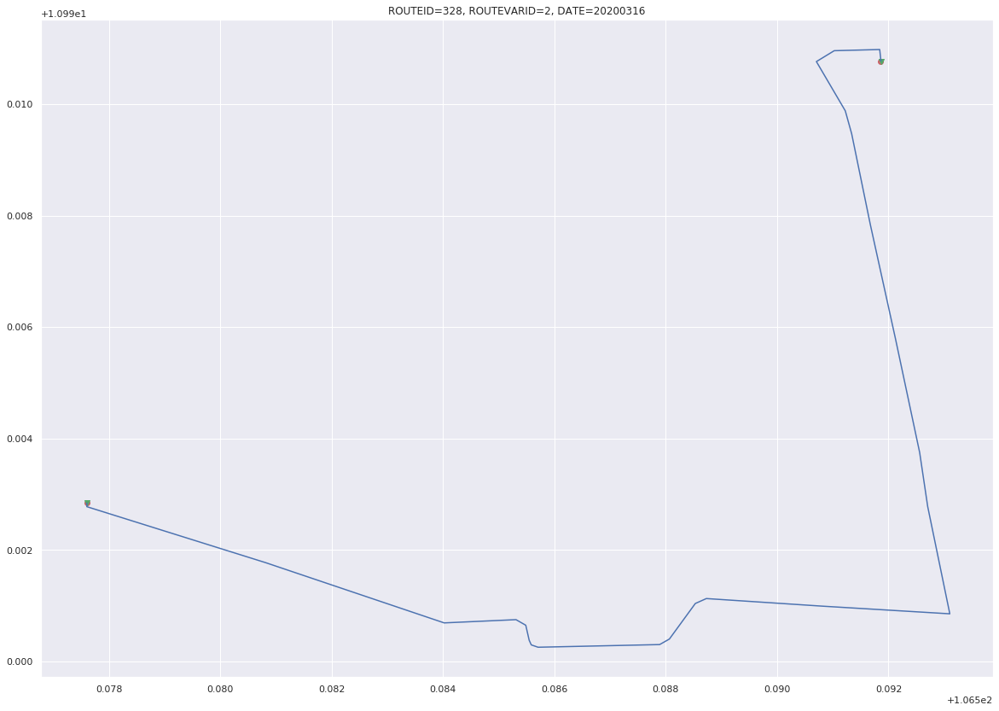

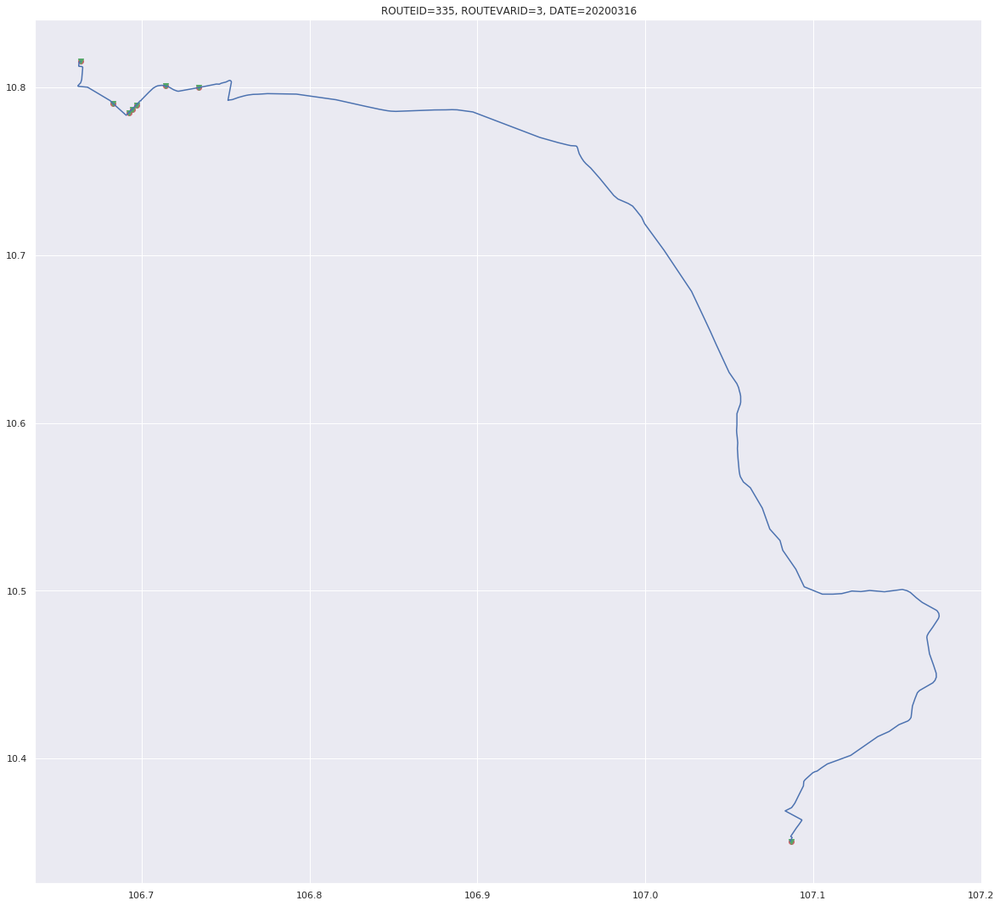

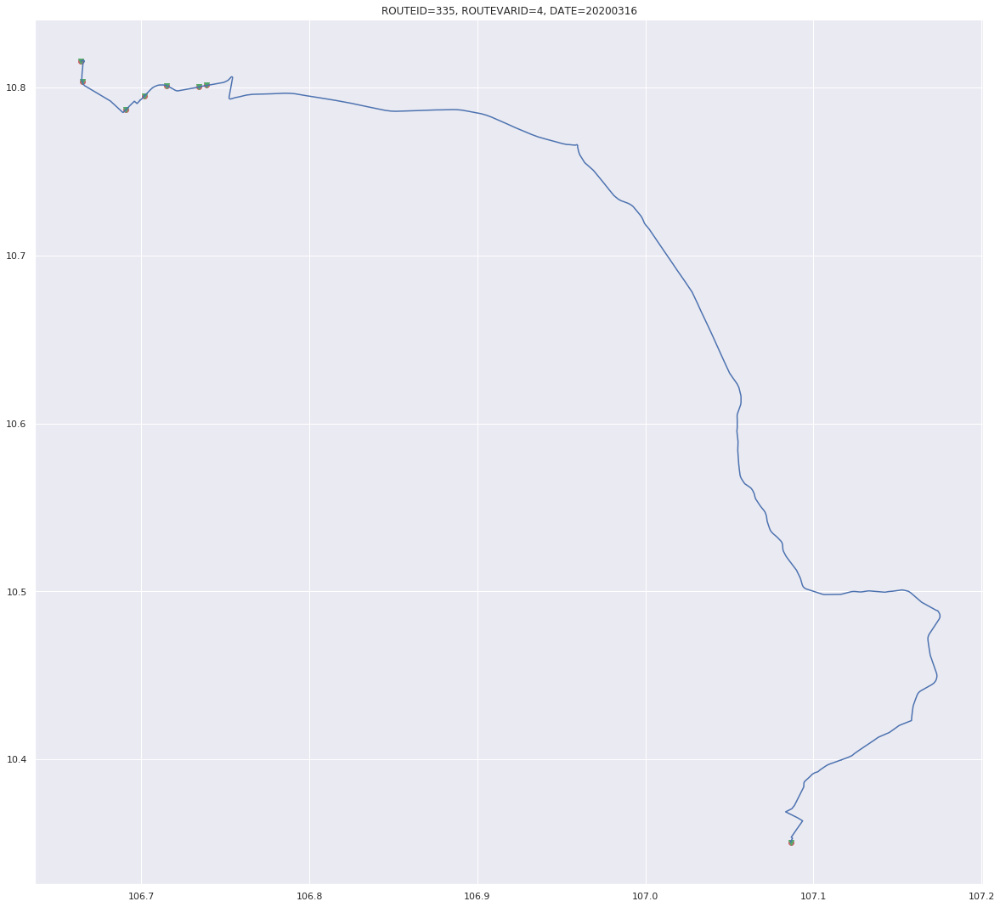

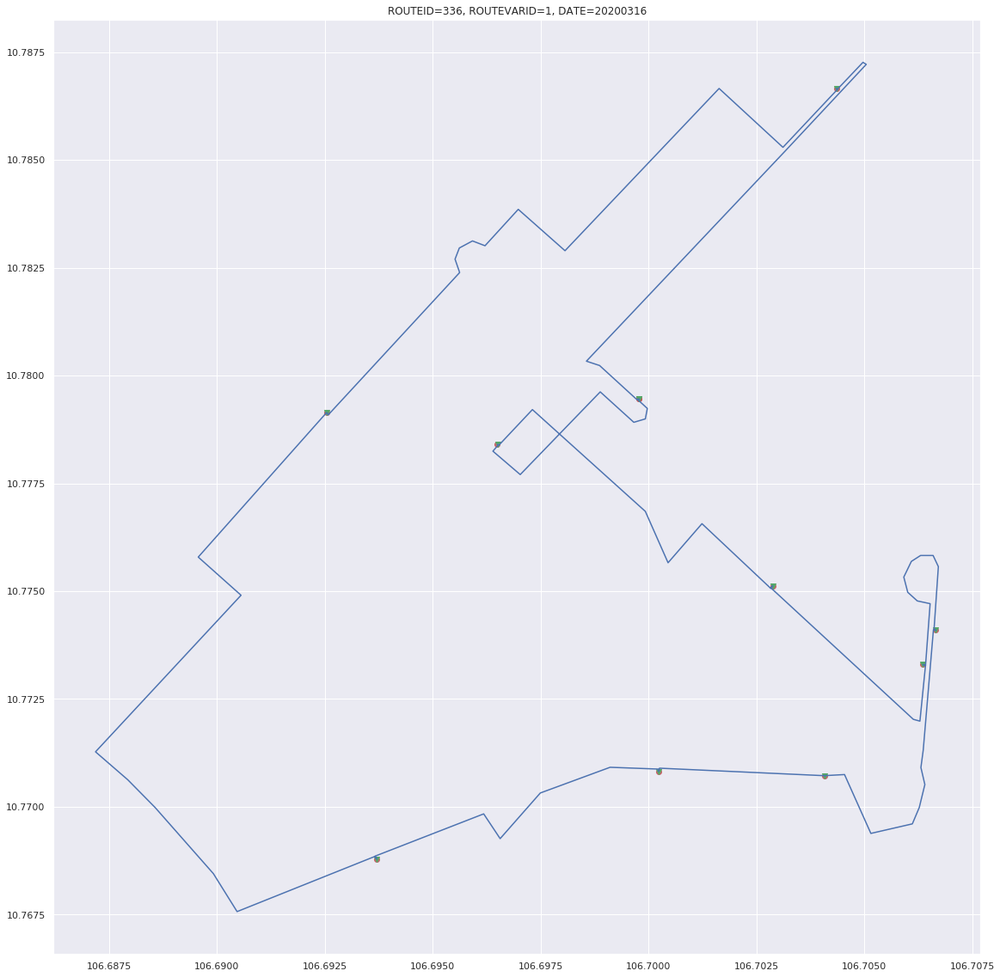

In [206]:
# Run for all route and multi date
list_date = generate_date_from_range(
    get_date_from_str("20200316"),
    get_date_from_str("20200316")
)

for d in list_date:
    stops_df, log_df = get_data_processed(
        d,
    )
    stops_df["DELTADIS"] = stops_df.apply(
        lambda x: x["SPOINT"].distance(x["NEARESTPOINT"]),
        axis=1,
    )

    list_route = stops_df[["ROUTEID", "ROUTEVARID"]].drop_duplicates().values
#     list_route = [(1, 1)]

    for lr in list_route:
        pl_ex = stops_df[(stops_df.ROUTEID==lr[0]) & (stops_df.ROUTEVARID==lr[1])].copy()
        plot_route_stops(pl_ex, show_path=(True, False))
        _draw(
            route_id=lr[0],
            route_var_id=lr[1],
            date=d,
        )

In [586]:
stops_df.DDBK.shape

(10419,)

__[Ref: Convert Degress to Metres](https://sciencing.com/convert-latitude-longtitude-feet-2724.html)__

In [589]:
# Convert Degress to Metres
stops_df["DTDISORIG"] = stops_df.DDBK.copy()
stops_df["DELTADIS"] = stops_df.DDBK.copy() * 111139

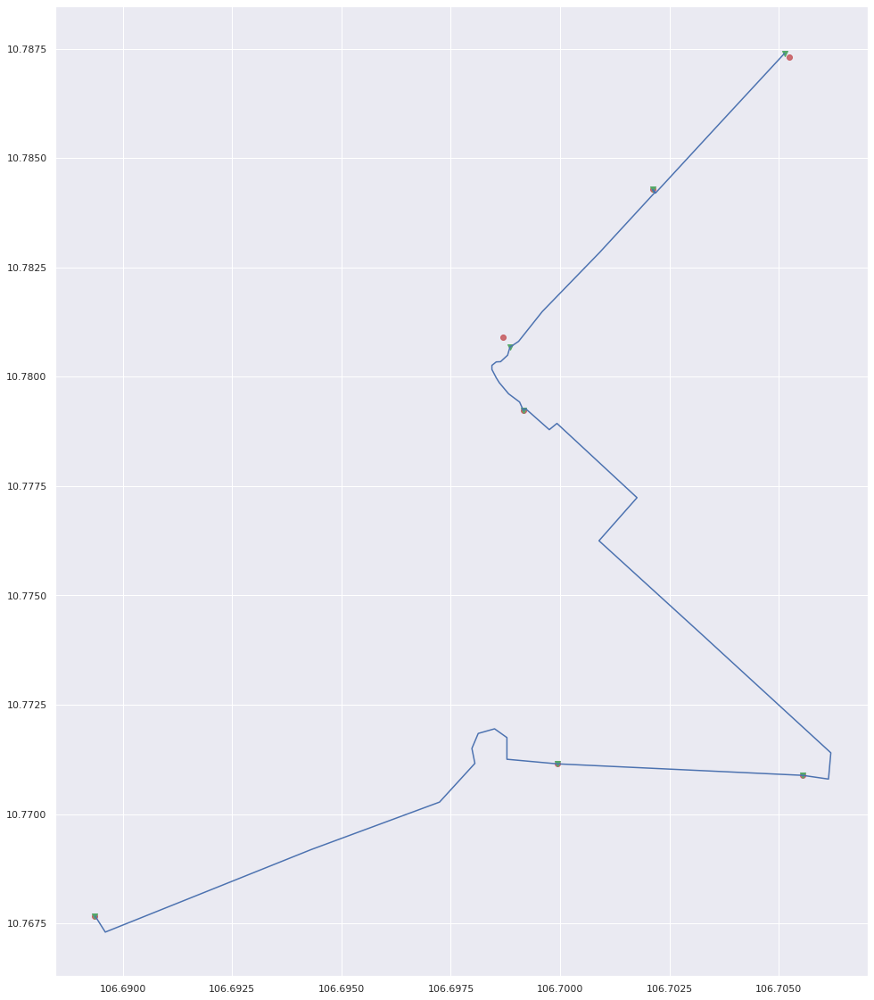

In [212]:
plot_route_stops(plot_example, show_path=(True, False))
plt.show()

In [590]:
stops_df.sort_values("DELTADIS", ascending=False).drop_duplicates(
    subset=["ROUTEID", "ROUTEVARID"], 
    keep="first",
).head(100)

,ROUTEID,ROUTEVARID,STOPID,CODE,NAME,STOPTYPE,ZONE,WARD,ADDRESSNO,STREET,SUPPORTDISABILITY,STATUS,LNG,LAT,SEARCH,ROUTES,LINESTRING,SPOINT,DISTANCE,NEARESTPOINT,RANK,MAXRANK,SPOINTFSPOINT,SPOINTLSPOINT,STOPS_LINESTRING,STOPSDISTANCE,ALLSTOPSDISTANCE,RATIOSTOPSDISTANCE,DELTADIS,DDBK,DTDISORIG
3646,44,87,2227,BX 39,Bến xe buýt Cầu Lớn,Bến xe,Huyện Hóc Môn,Xã Xuân Thới Sơn,BẾN XE BUÝT CẦU LỚN,Nguyễn Văn Bứa,,Đang khai thác,106.535561,10.871845,BxbCL BXBCL NVB,"23, 62-5, 78, 85","LINESTRING (106.65106964 10.75118542, 106.65092468 10.75101185, 106.65048981 10.75108528, 106.65...",POINT (106.535561 10.871845),0.203624,POINT (106.54167938 10.87070179),57.000000,57.000000,POINT (106.65107 10.751185),POINT (106.535561 10.871845),"LINESTRING (106.65107 10.751185, 106.65092468 10.75101185, 106.65048981 10.75108528, 106.6505813...",0.209848,0.209848,1.000000,691.758839,0.006224,0.006224
2063,26,2,725,BX 46,Bến xe Miền Tây,Bến xe,Quận Bình Tân,None,Bến xe Miền Tây,Kinh Dương Vương,,Đang khai thác,106.618317,10.740705,BxMT BxMT KDV,"02, 10, 102, 139, 14, 144, 148, 151, 32, 39, 41, 60-1, 61-8, 91","LINESTRING (106.6197972 10.74053589, 106.619922 10.74073772, 106.619607 10.74118199, 106.619339 ...",POINT (106.618317 10.740705),0.001197,POINT (106.619339 10.74149895),1.000000,42.000000,POINT (106.618317 10.740705),POINT (106.711294 10.814733),"LINESTRING (106.618317 10.740705, 106.619922 10.74073772, 106.619607 10.74118199, 106.619339 10....",0.000000,0.146815,0.000000,143.831240,0.001294,0.001294
8164,106,212,1185,BX 62,Bến xe buýt Tân Quy,Bến xe,Huyện Củ Chi,None,BẾN XE BUÝT TÂN QUY,"Tỉnh lộ 8, Củ Chi",,Đang khai thác,106.578176,10.984251,"BxbTQ BXBTQ Tl8,CC","122, 70","LINESTRING (106.45569611 11.1548872, 106.45718384 11.15444565, 106.45772552 11.1540556, 106.4581...",POINT (106.578176 10.984251),0.228530,POINT (106.57740784 10.98397732),35.000000,35.000000,POINT (106.455696 11.154887),POINT (106.578176 10.984251),"LINESTRING (106.455696 11.154887, 106.45718384 11.15444565, 106.45772552 11.1540556, 106.4581756...",0.229162,0.229162,1.000000,90.629103,0.000815,0.000815
1700,21,41,1203,Q7 178,Trường Nam Sài Gòn,Trụ dừng,Quận 7,Phường Tân Phong,Đ/d Trường Nam Sài Gòn,Nguyễn Đức Cảnh,,Đang khai thác,106.709948,10.722751,TNSG DTNSG NDC,"123, 124, 68, D2","LINESTRING (106.70935822 10.72323036, 106.70893097 10.72364044, 106.70886993 10.72375011, 106.70...",POINT (106.709948 10.722751),0.000000,POINT (106.70935822 10.72323036),1.000000,15.000000,POINT (106.709948 10.722751),POINT (106.704583 10.774611),"LINESTRING (106.709948 10.722751, 106.70893097 10.72364044, 106.70886993 10.72375011, 106.708801...",0.000000,0.077343,0.000000,84.467575,0.000760,0.000760
6911,90,1,3161,BX48,Chợ Bình Hưng Hòa,Bến xe,Quận Tân Phú,None,Bình Tân,Tân Kỳ Tân Quý,,Đang khai thác,106.599317,10.784613,CBHH BT TKTQ,61-8,"LINESTRING (106.61831665 10.74070454, 106.6185379 10.74090862, 106.61827087 10.74120903, 106.616...",POINT (106.599317 10.784613),0.061646,POINT (106.5986476470648 10.78439841670785),14.000000,68.000000,POINT (106.618317 10.740705),POINT (106.632571 11.042031),"LINESTRING (106.618317 10.740705, 106.6185379 10.74090862, 106.61827087 10.74120903, 106.6164474...",0.061646,0.537551,0.114679,78.120467,0.000703,0.000703
1731,22,43,1240,Q7 165,Mỹ Thái 2,Trụ dừng,Quận 7,Phường Tân Phú,Đ/d Chung cư Riverside,Nguyễn Lương Bằng,,Đang khai thác,106.726738,10.721022,MT2 DCcR NLB,"124, 139, D3","LINESTRING (106.7263031 10.72154999, 106.72586823 10.72224998, 106.72422028 10.72500038, 106.724...",POINT (106.726738 10.721022),0.000000,POINT (106.7263031 10.72154999),1.000000,22.000000,POINT (106.726738 10.721022),POINT (106.704583 10.774611),"LINESTRING (106.726738 10.721022, 106.72586823 10.72224998, 106.72422028 10.72500038, 106.724182...",0.000000,0.097854,0.000000,76.023581,0.000684,0.000684
8865,116,232,3692,BX26,Long Phước,Bến xe,Quận 9,None,ĐẦU BẾN HẺM 813 LONG PHƯỚC,Long Thuận,,Đang khai thác,106.860107,10.789044,LP DBH813LP LT,76,"LINESTRING (106.82582092 10.875285

In [591]:
stops_df.DELTADIS.var()

72.99360770512368

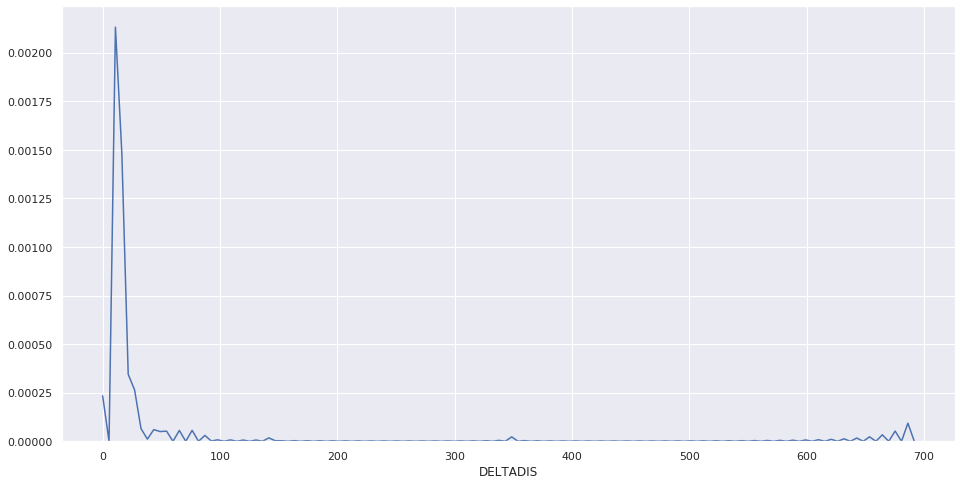

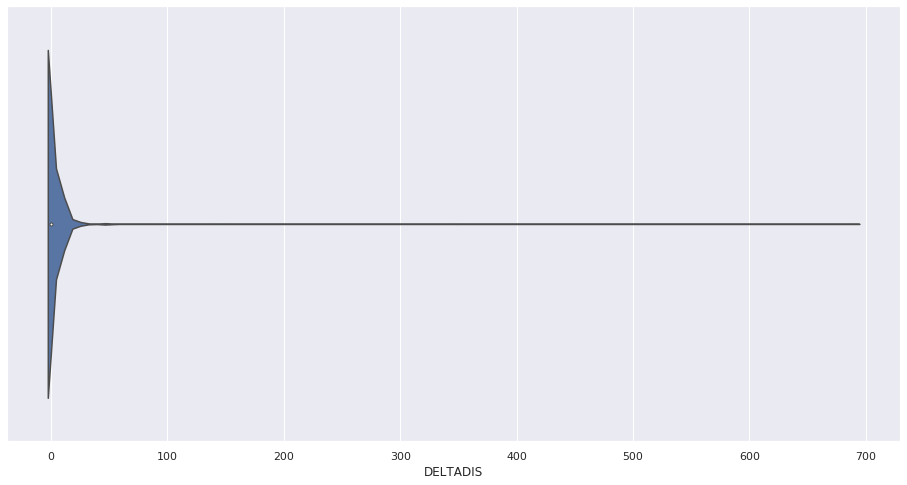

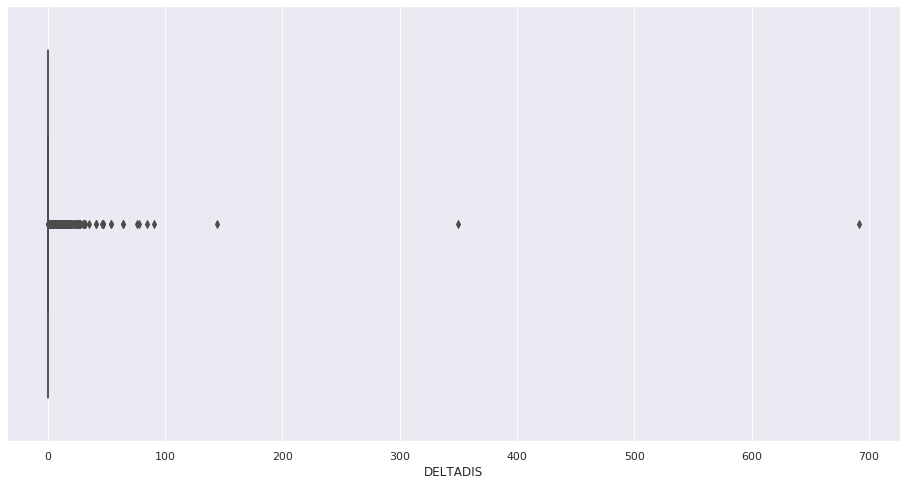

In [592]:
# Plot kde of DELTADIS
fig, ax = plt.subplots(figsize=(16, 8))
sns.distplot(stops_df.DELTADIS, hist=False, ax=ax)
plt.show()

# Plot kde of DELTADIS
fig, ax = plt.subplots(figsize=(16, 8))
sns.violinplot(stops_df.DELTADIS, ax=ax)
plt.show()

# Plot kde of DELTADIS
fig, ax = plt.subplots(figsize=(16, 8))
sns.boxplot(x=stops_df.DELTADIS, ax=ax)
plt.show()

In [593]:
stops_df.query("DELTADIS > 0.003 & DELTADIS < 0.004")

,ROUTEID,ROUTEVARID,STOPID,CODE,NAME,STOPTYPE,ZONE,WARD,ADDRESSNO,STREET,SUPPORTDISABILITY,STATUS,LNG,LAT,SEARCH,ROUTES,LINESTRING,SPOINT,DISTANCE,NEARESTPOINT,RANK,MAXRANK,SPOINTFSPOINT,SPOINTLSPOINT,STOPS_LINESTRING,STOPSDISTANCE,ALLSTOPSDISTANCE,RATIOSTOPSDISTANCE,DELTADIS,DDBK,DTDISORIG
6,1,1,7564,Q1 196,Bảo tàng Mỹ Thuật,Trụ dừng,Quận 1,Phường Bến Nghé,56,Nguyễn Thái Bình,Có,Đang khai thác,106.699669,10.769251,BtMT 56 NTB,"01, 102, 34, 38, 39, 86","LINESTRING (106.70585632 10.77678967, 106.7062912 10.77581787, 106.70614624 10.77576542, 106.706...",POINT (106.699669 10.769251),0.015895,POINT (106.6996690200879 10.76925097256223),7.000000,29.000000,POINT (106.705856 10.77679),POINT (106.6525650024414 10.75125312805176),"LINESTRING (106.705856 10.77679, 106.7062912 10.77581787, 106.70614624 10.77576542, 106.70605469...",0.015895,0.076539,0.207673,0.003779,0.000000,0.000000
112,2,2,144,Q6 035,Chợ Hoa,Trụ dừng,Quận 6,None,411,Hậu Giang,,Đang khai thác,106.638204,10.748756,CH 411 HG,"02, 148, 25, 61","LINESTRING (106.61831665 10.74070454, 106.61831665 10.74070454, 106.61821747 10.74081898, 106.61...",POINT (106.638204 10.748756),0.022827,POINT (106.6382040052809 10.7487559702793),9.000000,40.000000,POINT (106.618317 10.740705),POINT (106.705856 10.77679),"LINESTRING (106.618317 10.740705, 106.61831665 10.74070454, 106.61821747 10.74081898, 106.618469...",0.022828,0.115112,0.198309,0.003355,0.000000,0.000000
247,4,7,1256,Q1 195,Chợ Cũ,Nhà chờ,Quận 1,None,89A,Hàm Nghi,,Đang khai thác,106.701998,10.770811,CC 89A HN,"01, 02, 03, 04, 11, 152, 18, 19, 31, 36, 45, 52, 56, 61-6, 75, 86, 88, 93","LINESTRING (106.68936157 10.76767635, 106.68936157 10.76767635, 106.68955994 10.7672224, 106.690...",POINT (106.701998 10.770811),0.014743,POINT (106.7019979982229 10.77081096639605),6.000000,47.000000,POINT (106.689362 10.767676),POINT (106.6133728027344 10.84373760223389),"LINESTRING (106.689362 10.767676, 106.68936157 10.76767635, 106.68955994 10.7672224, 106.6908645...",0.014744,0.150776,0.097787,0.003740,0.000000,0.000000
296,4,8,176,QTP 012,Ngã 3 Chế Lan Viên,Nhà chờ,Quận Tân Phú,Phường Tây Thạnh,831 (trước showroom o tô),Trường Chinh,Có,Đang khai thác,106.631472,10.817114,N3CLV 831(sot TC,"04, 104, 145, 23, 27, 28, 62, 65, 70-3","LINESTRING (106.6133728 10.8437376, 106.61418152 10.84418106, 106.61500549 10.84297943, 106.6150...",POINT (106.631472 10.817114),0.033943,POINT (106.6314720011988 10.8171139696196),8.000000,39.000000,POINT (106.6133728027344 10.84373760223389),POINT (106.689362 10.767676),"LINESTRING (106.6133728027344 10.84373760223389, 106.61418152 10.84418106, 106.61500549 10.84297...",0.033943,0.140390,0.241779,0.003379,0.000000,0.000000
426,5,2,301,QBTH 135,Siêu thị Coop Mart,Trụ dừng,Quận Bình Thạnh,None,222/13A (52),Quốc lộ 13,,Đang khai thác,106.712410,10.810791,StCM 222/13A( Ql13,"05, 08, 14, 146, 19, 24, 43, 45, 60-3, 60-4, 61-6, 64, 93","LINESTRING (106.652565 10.75125313, 106.6521759 10.75122738, 106.65192413 10.75105953, 106.65101...",POINT (106.71241 10.810791),0.114338,POINT (106.7124099677324 10.81079100482029),30.000000,59.000000,POINT (106.6525650024414 10.75125312805176),POINT (106.808953 10.954127),"LINESTRING (106.6525650024414 10.75125312805176, 106.6521759 10.75122738, 106.65192413 10.751059...",0.114338,0.320902,0.356302,0.003626,0.000000,0.000000
429,5,2,309,QTD 199,Trạm xăng dầu,Trụ dừng,Quận Thủ Đức,Phường Hiệp Bình Chánh,206 Sacombank (64/1),Quốc lộ 13,,Đang khai thác,106.714149,10.832655,Txd 206S( Ql13,"05, 19, 61-6","LINESTRING (106.652565 10.75125313, 106.6521759 10.75122738, 106.65192413 10.75105953, 106.65101...",POINT (106.714149 10.832655),0.136817,POINT (106.7141489987523 10.83265497004323),33.000000,59.000000,POINT (106.6525650024414 10.75125312805176),POINT (106.808953 10.954127),"LINESTRING (106.6525650024414 10.75125312805176, 106.6521759 10.75122738, 106.65192413 10.751059...",0.136817,0.320902,0.426353,0.003332,0.000000,0.000000
713,8,15,529,QTD 124,Cầu Gò Dưa,Nhà chờ,Quận Thủ Đức,Phườn

In [594]:
stops_df.query("DELTADIS > 0.004 & DELTADIS < 0.007")

,ROUTEID,ROUTEVARID,STOPID,CODE,NAME,STOPTYPE,ZONE,WARD,ADDRESSNO,STREET,SUPPORTDISABILITY,STATUS,LNG,LAT,SEARCH,ROUTES,LINESTRING,SPOINT,DISTANCE,NEARESTPOINT,RANK,MAXRANK,SPOINTFSPOINT,SPOINTLSPOINT,STOPS_LINESTRING,STOPSDISTANCE,ALLSTOPSDISTANCE,RATIOSTOPSDISTANCE,DELTADIS,DDBK,DTDISORIG
13,1,1,126,Q1 130,Chợ Nanci,Trụ dừng,Quận 1,None,290,Trần Hưng Đạo,,Đang khai thác,106.686035,10.757467,CN 290 THD,"01, 139, 152","LINESTRING (106.70585632 10.77678967, 106.7062912 10.77581787, 106.70614624 10.77576542, 106.706...",POINT (106.686035 10.757467),0.036357,POINT (106.6860349585294 10.75746703565269),14.000000,29.000000,POINT (106.705856 10.77679),POINT (106.6525650024414 10.75125312805176),"LINESTRING (106.705856 10.77679, 106.7062912 10.77581787, 106.70614624 10.77576542, 106.70605469...",0.036358,0.076539,0.475023,0.006078,0.000000,0.000000
87,2,1,103,Q11 003,Tạ Uyên,Trụ dừng,Quận 11,None,1114A-1116A,Đường 3/2,,Đang khai thác,106.653557,10.760535,TU 1114A-1116A D3/2,"02, 103, 14","LINESTRING (106.70585632 10.77678967, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.70...",POINT (106.653557 10.760535),0.074920,POINT (106.6535569544377 10.7605349767335),26.000000,42.000000,POINT (106.705856 10.77679),POINT (106.618317 10.740705),"LINESTRING (106.705856 10.77679, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.7061843...",0.074921,0.119483,0.627043,0.005686,0.000000,0.000000
94,2,1,111,Q6 025,Cầu Hậu Giang,Trụ dừng,Quận 6,None,212A,Hậu Giang,,Đang khai thác,106.641503,10.749736,CHG 212A HG,"02, 148, 25, 61","LINESTRING (106.70585632 10.77678967, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.70...",POINT (106.641503 10.749736),0.092561,POINT (106.6415030096831 10.74973594858142),33.000000,42.000000,POINT (106.705856 10.77679),POINT (106.618317 10.740705),"LINESTRING (106.705856 10.77679, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.7061843...",0.092561,0.119483,0.774684,0.005815,0.000000,0.000000
155,3,5,42,Q1 058,Nhà Hát Thành Phố,Ô sơn,Quận 1,None,74/A2-74/A4,Hai Bà Trưng,,Đang khai thác,106.703559,10.778031,NHTP 74/A2-74/A4 HBT,"03, 19, 45","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.703559 10.778031),0.030403,POINT (106.7035589879162 10.77803103412674),12.000000,47.000000,POINT (106.689362 10.767676),POINT (106.682335 10.878941),"LINESTRING (106.689362 10.767676, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.690940...",0.030403,0.157736,0.192746,0.004024,0.000000,0.000000
166,3,5,51,QPN 002,Nhà Truyền Thông,Trụ dừng,Quận Phú Nhuận,None,466,Nguyễn Kiệm,,Đang khai thác,106.679245,10.802232,NTT 466 NK,"03, 55","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.679245 10.802232),0.065703,POINT (106.6792449442433 10.802231983973),23.000000,47.000000,POINT (106.689362 10.767676),POINT (106.682335 10.878941),"LINESTRING (106.689362 10.767676, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.690940...",0.065703,0.157736,0.416537,0.006448,0.000000,0.000000
173,3,5,60,QGV 187,Cầu vượt ngã sáu Gò Vấp,Trụ dừng,Quận Gò Vấp,None,140-142,Phạm Ngũ Lão,,Đang khai thác,106.681221,10.824607,CvnsGV 140-142 PNL,"03, 07, 103, 148, 55, 59","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.681221 10.824607),0.090711,POINT (106.6812209650454 10.82460698047345),30.000000,47.000000,POINT (106.689362 10.767676),POINT (106.682335 10.878941),"LINESTRING (106.689362 10.767676, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.690940...",0.090710,0.157736,0.575076,0.004450,0.000000,0.000000
186,3,5,70,Q12 037,Ga ra Thanh Hậu,Trụ dừng,Quận 12,None,508,Hà Huy Giáp,,Đang khai thác,106.677032,10.875454,GrTH 508 HHG,"03, 58","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.677032 10.875454),0.145570,POINT (106.6770320100065 10.87545404730453),43.0000

In [595]:
stops_df.query("DELTADIS > 0.004 & DELTADIS < 0.007")

,ROUTEID,ROUTEVARID,STOPID,CODE,NAME,STOPTYPE,ZONE,WARD,ADDRESSNO,STREET,SUPPORTDISABILITY,STATUS,LNG,LAT,SEARCH,ROUTES,LINESTRING,SPOINT,DISTANCE,NEARESTPOINT,RANK,MAXRANK,SPOINTFSPOINT,SPOINTLSPOINT,STOPS_LINESTRING,STOPSDISTANCE,ALLSTOPSDISTANCE,RATIOSTOPSDISTANCE,DELTADIS,DDBK,DTDISORIG
13,1,1,126,Q1 130,Chợ Nanci,Trụ dừng,Quận 1,None,290,Trần Hưng Đạo,,Đang khai thác,106.686035,10.757467,CN 290 THD,"01, 139, 152","LINESTRING (106.70585632 10.77678967, 106.7062912 10.77581787, 106.70614624 10.77576542, 106.706...",POINT (106.686035 10.757467),0.036357,POINT (106.6860349585294 10.75746703565269),14.000000,29.000000,POINT (106.705856 10.77679),POINT (106.6525650024414 10.75125312805176),"LINESTRING (106.705856 10.77679, 106.7062912 10.77581787, 106.70614624 10.77576542, 106.70605469...",0.036358,0.076539,0.475023,0.006078,0.000000,0.000000
87,2,1,103,Q11 003,Tạ Uyên,Trụ dừng,Quận 11,None,1114A-1116A,Đường 3/2,,Đang khai thác,106.653557,10.760535,TU 1114A-1116A D3/2,"02, 103, 14","LINESTRING (106.70585632 10.77678967, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.70...",POINT (106.653557 10.760535),0.074920,POINT (106.6535569544377 10.7605349767335),26.000000,42.000000,POINT (106.705856 10.77679),POINT (106.618317 10.740705),"LINESTRING (106.705856 10.77679, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.7061843...",0.074921,0.119483,0.627043,0.005686,0.000000,0.000000
94,2,1,111,Q6 025,Cầu Hậu Giang,Trụ dừng,Quận 6,None,212A,Hậu Giang,,Đang khai thác,106.641503,10.749736,CHG 212A HG,"02, 148, 25, 61","LINESTRING (106.70585632 10.77678967, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.70...",POINT (106.641503 10.749736),0.092561,POINT (106.6415030096831 10.74973594858142),33.000000,42.000000,POINT (106.705856 10.77679),POINT (106.618317 10.740705),"LINESTRING (106.705856 10.77679, 106.70597076 10.77662945, 106.70631409 10.77582836, 106.7061843...",0.092561,0.119483,0.774684,0.005815,0.000000,0.000000
155,3,5,42,Q1 058,Nhà Hát Thành Phố,Ô sơn,Quận 1,None,74/A2-74/A4,Hai Bà Trưng,,Đang khai thác,106.703559,10.778031,NHTP 74/A2-74/A4 HBT,"03, 19, 45","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.703559 10.778031),0.030403,POINT (106.7035589879162 10.77803103412674),12.000000,47.000000,POINT (106.689362 10.767676),POINT (106.682335 10.878941),"LINESTRING (106.689362 10.767676, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.690940...",0.030403,0.157736,0.192746,0.004024,0.000000,0.000000
166,3,5,51,QPN 002,Nhà Truyền Thông,Trụ dừng,Quận Phú Nhuận,None,466,Nguyễn Kiệm,,Đang khai thác,106.679245,10.802232,NTT 466 NK,"03, 55","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.679245 10.802232),0.065703,POINT (106.6792449442433 10.802231983973),23.000000,47.000000,POINT (106.689362 10.767676),POINT (106.682335 10.878941),"LINESTRING (106.689362 10.767676, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.690940...",0.065703,0.157736,0.416537,0.006448,0.000000,0.000000
173,3,5,60,QGV 187,Cầu vượt ngã sáu Gò Vấp,Trụ dừng,Quận Gò Vấp,None,140-142,Phạm Ngũ Lão,,Đang khai thác,106.681221,10.824607,CvnsGV 140-142 PNL,"03, 07, 103, 148, 55, 59","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.681221 10.824607),0.090711,POINT (106.6812209650454 10.82460698047345),30.000000,47.000000,POINT (106.689362 10.767676),POINT (106.682335 10.878941),"LINESTRING (106.689362 10.767676, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.690940...",0.090710,0.157736,0.575076,0.004450,0.000000,0.000000
186,3,5,70,Q12 037,Ga ra Thanh Hậu,Trụ dừng,Quận 12,None,508,Hà Huy Giáp,,Đang khai thác,106.677032,10.875454,GrTH 508 HHG,"03, 58","LINESTRING (106.68936157 10.76767635, 106.68955994 10.76718521, 106.69094086 10.76766968, 106.69...",POINT (106.677032 10.875454),0.145570,POINT (106.6770320100065 10.87545404730453),43.0000

In [596]:
stops_df.query("DELTADIS > 0.0005 & DELTADIS < 0.001")

,ROUTEID,ROUTEVARID,STOPID,CODE,NAME,STOPTYPE,ZONE,WARD,ADDRESSNO,STREET,SUPPORTDISABILITY,STATUS,LNG,LAT,SEARCH,ROUTES,LINESTRING,SPOINT,DISTANCE,NEARESTPOINT,RANK,MAXRANK,SPOINTFSPOINT,SPOINTLSPOINT,STOPS_LINESTRING,STOPSDISTANCE,ALLSTOPSDISTANCE,RATIOSTOPSDISTANCE,DELTADIS,DDBK,DTDISORIG
129,2,2,161,Q3 018,Rạp Đại Đồng,Nhà chờ,Quận 3,None,75,Cao Thắng,,Đang khai thác,106.679947,10.771820,RDD 75 CT,02,"LINESTRING (106.61831665 10.74070454, 106.61831665 10.74070454, 106.61821747 10.74081898, 106.61...",POINT (106.679947 10.77182),0.074794,POINT (106.6799469944408 10.77181999316683),26.000000,40.000000,POINT (106.618317 10.740705),POINT (106.705856 10.77679),"LINESTRING (106.618317 10.740705, 106.61831665 10.74070454, 106.61821747 10.74081898, 106.618469...",0.074795,0.115112,0.649752,0.000979,0.000000,0.000000
757,8,16,590,QBTH 004,Tòa Án nhân dân Quận Bình Thạnh,Trụ dừng,Quận Bình Thạnh,None,288,Bạch Đằng,,Đang khai thác,106.701187,10.803873,TAndQBT 288 BD,"08, 104, 146, 24, 55, 91","LINESTRING (106.80202484 10.87380505, 106.8020401 10.87360954, 106.80142975 10.87377834, 106.800...",POINT (106.701187 10.803873),0.158345,POINT (106.7011870034455 10.80387299344807),28.000000,65.000000,POINT (106.8020248413086 10.87380504608154),POINT (106.656357 10.733545),"LINESTRING (106.8020248413086 10.87380504608154, 106.8020401 10.87360954, 106.80142975 10.873778...",0.158345,0.285329,0.554957,0.000823,0.000000,0.000000
1074,13,25,853,Q1 001,Calmette,Trụ dừng,Quận 1,None,97,Calmette,,Đang khai thác,106.699219,10.767768,C 97 C,"102, 123, 124, 34, 38, 44, 86","LINESTRING (106.68936157 10.76767635, 106.68936157 10.76767635, 106.68955994 10.76720715, 106.69...",POINT (106.699219 10.767768),0.018325,POINT (106.699219002 10.767767994),7.000000,60.000000,POINT (106.689362 10.767676),POINT (106.618317 10.740705),"LINESTRING (106.689362 10.767676, 106.68936157 10.76767635, 106.68955994 10.76720715, 106.690895...",0.018325,0.292628,0.062623,0.000703,0.000000,0.000000
1093,13,25,875,HBC 003,Phúc Minh,Trụ dừng,Huyện Bình Chánh,None,C10/5A (C10/56),Nguyễn Văn Linh,,Đang khai thác,106.679472,10.728486,PM C( NVL,"102, 34","LINESTRING (106.68936157 10.76767635, 106.68936157 10.76767635, 106.68955994 10.76720715, 106.69...",POINT (106.679472 10.728486),0.114298,POINT (106.6794719998521 10.72848600506111),26.000000,60.000000,POINT (106.689362 10.767676),POINT (106.618317 10.740705),"LINESTRING (106.689362 10.767676, 106.68936157 10.76767635, 106.68955994 10.76720715, 106.690895...",0.114299,0.292628,0.390595,0.000563,0.000000,0.000000
1247,14,1,946,BX37,Bến xe Ngã tư Ga,Bến xe,Quận 12,None,Bến xe Ngã Tư Ga,Quốc lộ 1A,,Đang khai thác,106.678360,10.862157,BxNtG BxNTG Ql1A,"103, 32, 58, 59","LINESTRING (106.65261078 10.75125885, 106.65216827 10.75122261, 106.65193176 10.75101185, 106.65...",POINT (106.6783599853516 10.86215686798096),0.230429,POINT (106.6783599899615 10.86215686789656),58.000000,58.000000,POINT (106.652607 10.751259),POINT (106.6783599853516 10.86215686798096),"LINESTRING (106.652607 10.751259, 106.65216827 10.75122261, 106.65193176 10.75101185, 106.650947...",0.230425,0.230425,1.000000,0.000512,0.000000,0.000000
1248,14,2,946,BX37,Bến xe Ngã tư Ga,Bến xe,Quận 12,None,Bến xe Ngã Tư Ga,Quốc lộ 1A,,Đang khai thác,106.678360,10.862157,BxNtG BxNTG Ql1A,"103, 32, 58, 59","LINESTRING (106.67835999 10.86215687, 106.67832947 10.86167717, 106.67647552 10.86183548, 106.67...",POINT (106.6783599853516 10.86215686798096),0.000000,POINT (106.6783599898533 10.86215686769454),1.000000,60.000000,POINT (106.6783599853516 10.86215686798096),POINT (106.652607 10.751259),"LINESTRING (106.6783599853516 10.86215686798096, 106.67832947 10.86167717, 106.67647552 10.86183...",0.000000,0.203210,0.000000,0.000501,0.000000,0.000000
1402,15,30,591,QBTH 115,UBND Quận Bình Thạnh,Trụ dừng,Quận Bình Thạnh,Phường 14,6-8,Phan Đăng Lưu,,Đang khai thác,106.695786,10.802819,UQBT 6-8 PDL,"08, 104, 146, 18, 31, 36, 55, 91","LINESTRING (106.78744507 10.86818314, 106.78772736 10.86

Tìm bằng cách lấy median của những Route trong đó Stops có `DELTADIS` lớn nhất

In [598]:
stops_df.sort_values("STOPID").head(2)

,ROUTEID,ROUTEVARID,STOPID,CODE,NAME,STOPTYPE,ZONE,WARD,ADDRESSNO,STREET,SUPPORTDISABILITY,STATUS,LNG,LAT,SEARCH,ROUTES,LINESTRING,SPOINT,DISTANCE,NEARESTPOINT,RANK,MAXRANK,SPOINTFSPOINT,SPOINTLSPOINT,STOPS_LINESTRING,STOPSDISTANCE,ALLSTOPSDISTANCE,RATIOSTOPSDISTANCE,DELTADIS,DDBK,DTDISORIG
3926,46,92,1,Q6 095,Chu Văn An,Trụ dừng,Quận 6,None,27,Tháp Mười,,Đang khai thác,106.652554,10.750232,CVA 27 TM,"01, 07, 10, 144, 150, 25","LINESTRING (106.57068634 10.81153488, 106.57068634 10.81153488, 106.57093048 10.81142902, 106.57...",POINT (106.652554 10.750232),0.177176,POINT (106.6525568367507 10.75023310676809),42.000000,47.000000,POINT (106.570686 10.811535),POINT (106.656357 10.733545),"LINESTRING (106.570686 10.811535, 106.57068634 10.81153488, 106.57093048 10.81142902, 106.571006...",0.177176,0.204845,0.864926,0.338419,0.000003,0.000003
30,1,2,1,Q6 095,Chu Văn An,Trụ dừng,Quận 6,None,27,Tháp Mười,,Đang khai thác,106.652554,10.750232,CVA 27 TM,"01, 07, 10, 144, 150, 25","LINESTRING (106.652565 10.75125313, 106.65222168 10.75123787, 106.65202332 10.75113773, 106.6519...",POINT (106.652554 10.750232),0.007780,POINT (106.6525541195434 10.75023123323424),2.000000,33.000000,POINT (106.6525650024414 10.75125312805176),POINT (106.705856 10.77679),"LINESTRING (106.6525650024414 10.75125312805176, 106.65222168 10.75123787, 106.65202332 10.75113...",0.007780,0.087289,0.089134,0.086247,0.000001,0.000001


In [599]:
stops_df.groupby(["STOPID"]).DELTADIS.median().to_frame("MEDIAN").sort_values(by="MEDIAN", ascending=False).head(10)

,MEDIAN
STOPID,
3161,78.120467
3692,63.801159
3343,35.540798
3801,31.743579
1424,29.862258
3347,26.411784
3349,26.257532
2479,24.840986
1615,23.717327


In [600]:
list_stop_md = stops_df.groupby(["ROUTEID", "ROUTEVARID"]).DELTADIS.median().to_frame("MEDIAN").sort_values(by="MEDIAN", ascending=False).reset_index()
list_stop_md

,ROUTEID,ROUTEVARID,MEDIAN
0,119,237,7.876146
1,21,41,7.521328
2,118,1,7.401295
3,117,236,5.970232
4,23,46,5.084504
5,119,238,5.051065
6,117,235,4.687280
7,16,31,3.231208
8,106,212,2.541969
9,302,2,0.397746


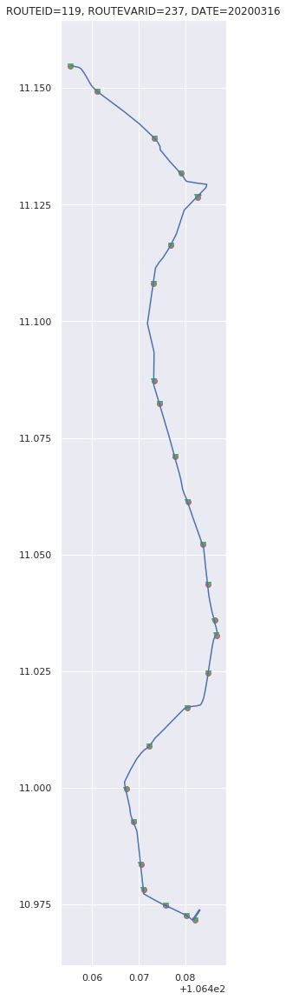

In [601]:
# to plot some example route
_rid = 119
_rvar = 237
pl_ex = stops_df[(stops_df.ROUTEID==_rid) & (stops_df.ROUTEVARID==_rvar)].copy()
plot_route_stops(pl_ex, show_path=(True, False))
_draw(
    route_id=_rid,
    route_var_id=_rvar,
    date=d,
)

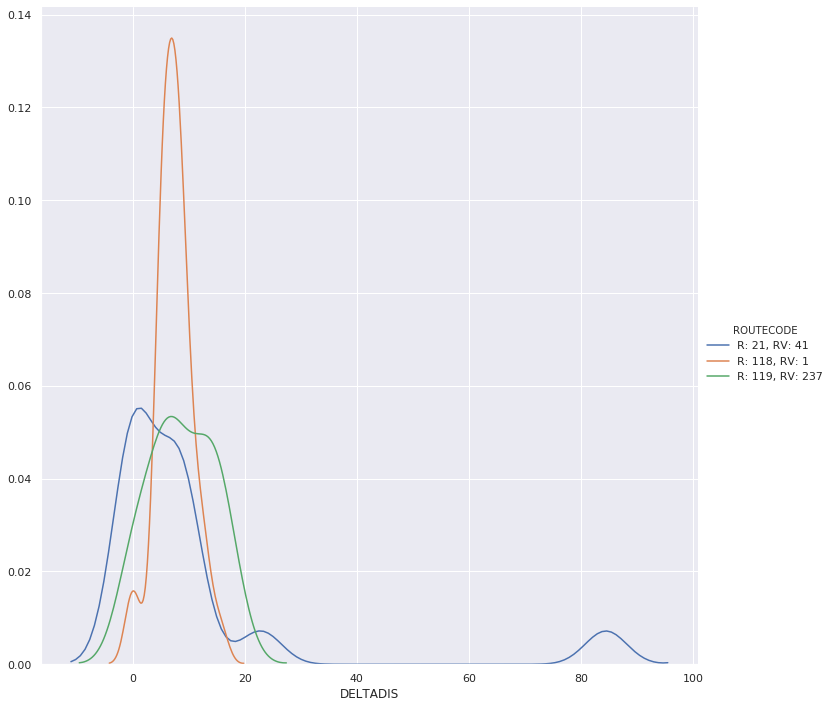

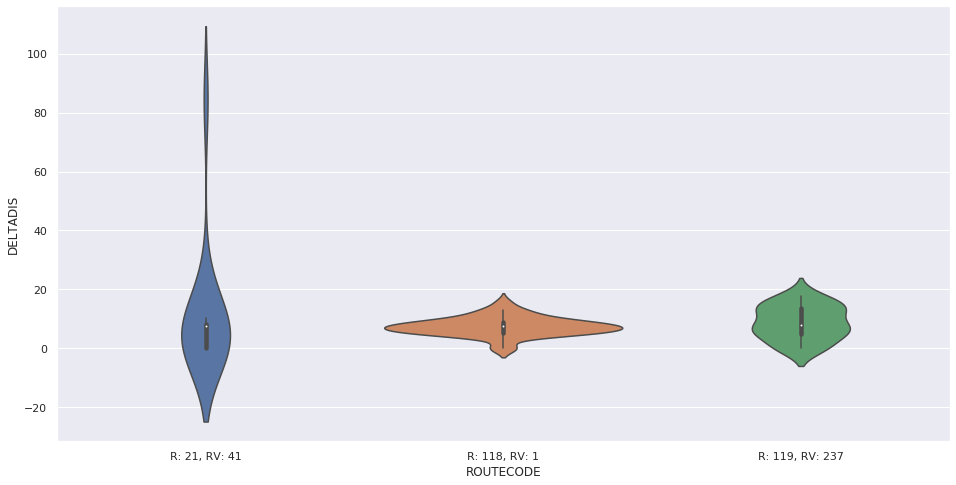

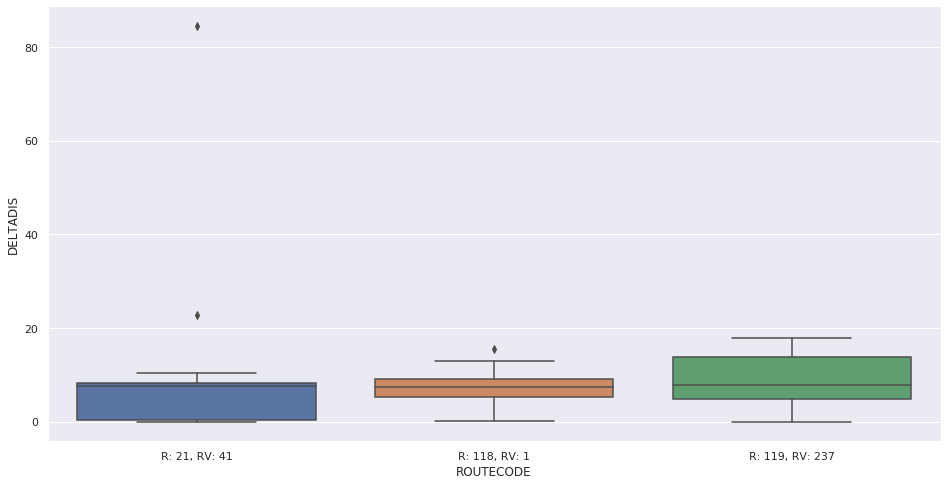

In [602]:
# Plot theo route
list_stop_md.iloc[:3, :2]

list_stop_md["ROUTECODE"] = (
    "R: " 
    + list_stop_md["ROUTEID"].astype("str") 
    + ", RV: "
    + list_stop_md["ROUTEVARID"].astype("str")
)

example_hue = stops_df.merge(
    list_stop_md[:3],
    on = ["ROUTEID", "ROUTEVARID"]
)

# Multi KDE
grid = sns.FacetGrid(example_hue, hue="ROUTECODE", height=10)
grid.map(sns.kdeplot, "DELTADIS")
grid.add_legend()
plt.show()

# Plot kde of DELTADIS
fig, ax = plt.subplots(figsize=(16, 8))
sns.violinplot(y="DELTADIS", x="ROUTECODE", ax=ax, data=example_hue)
plt.show()

# Plot kde of DELTADIS
fig, ax = plt.subplots(figsize=(16, 8))
sns.boxplot(y="DELTADIS", x="ROUTECODE", ax=ax, data=example_hue)
plt.show()

In [603]:
stops_df.STOPID.value_counts().sort_values(ascending=False).index[22:26].tolist()

[271, 4149, 302, 301]

Save fig/Show for stop: 7277


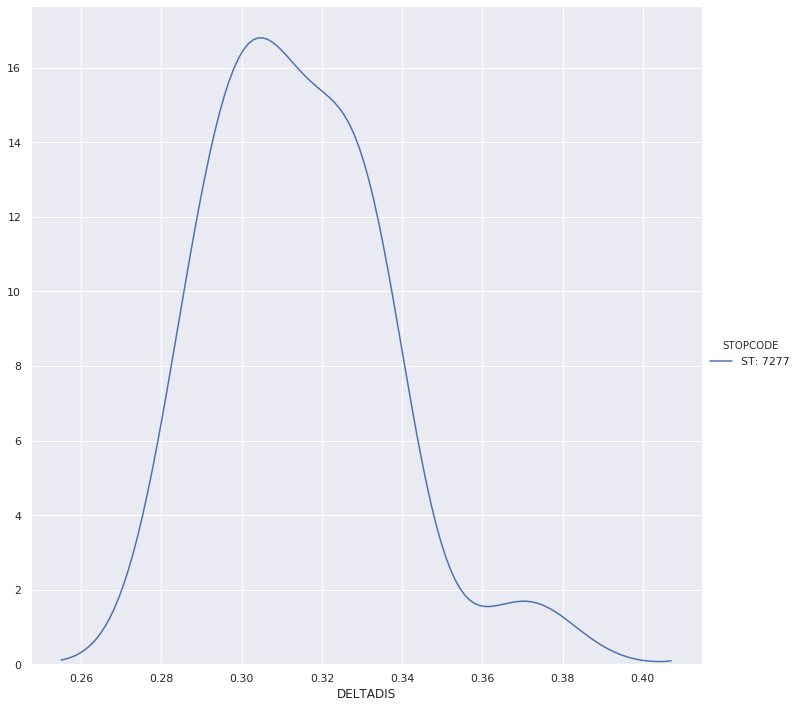

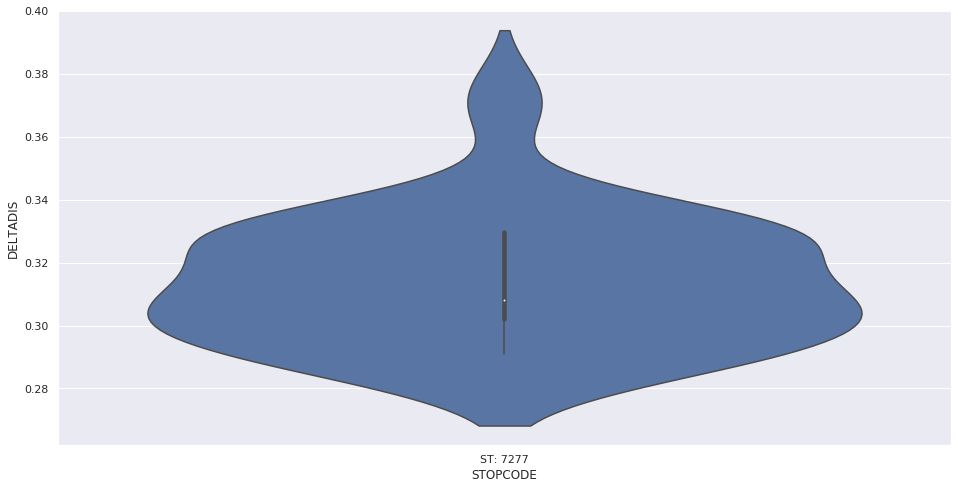

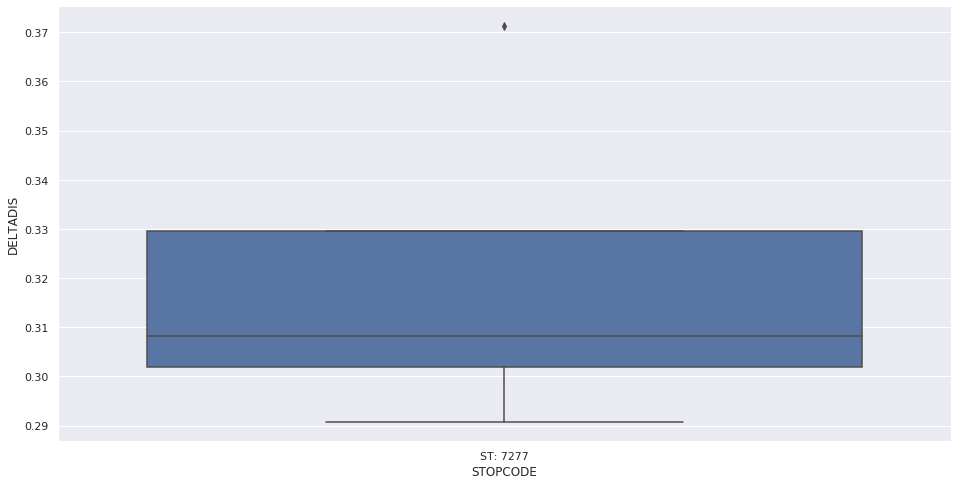

In [605]:
# Plot từng stop riêng biệt
plot_kde_stops([7277], stops_df, "../plot_image/KDE_plot", plot=True)

In [ ]:
# Plot tất cả các stop
plot_kde_stops(stops_df.STOPID.unique(), stops_df, "../plot_image/KDE_plot", plot=False)

Save fig/Show for stop: 33
Save fig/Show for stop: 79
Save fig/Show for stop: 76
Save fig/Show for stop: 3691


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 2028
Save fig/Show for stop: 4223
Save fig/Show for stop: 7564
Save fig/Show for stop: 120
Save fig/Show for stop: 121
Save fig/Show for stop: 122


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 123


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 124


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 125


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 126
Save fig/Show for stop: 127


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 128


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 129


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 130


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 131


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 134


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 132


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 14
Save fig/Show for stop: 136


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 133


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 135


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 137
Save fig/Show for stop: 138
Save fig/Show for stop: 139
Save fig/Show for stop: 8
Save fig/Show for stop: 1
Save fig/Show for stop: 2


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 3
Save fig/Show for stop: 5
Save fig/Show for stop: 4


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 7


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 9


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 12


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 6


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 10
Save fig/Show for stop: 11
Save fig/Show for stop: 16


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 17


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 13


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 15


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 19


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 20


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 18
Save fig/Show for stop: 22
Save fig/Show for stop: 21
Save fig/Show for stop: 23
Save fig/Show for stop: 24
Save fig/Show for stop: 25


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 26
Save fig/Show for stop: 27
Save fig/Show for stop: 7266


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 1256
Save fig/Show for stop: 32
Save fig/Show for stop: 31
Save fig/Show for stop: 34
Save fig/Show for stop: 7270
Save fig/Show for stop: 7269
Save fig/Show for stop: 1944
Save fig/Show for stop: 85
Save fig/Show for stop: 87
Save fig/Show for stop: 86
Save fig/Show for stop: 88


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 89
Save fig/Show for stop: 90
Save fig/Show for stop: 91


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 92
Save fig/Show for stop: 93


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 95
Save fig/Show for stop: 94


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 97
Save fig/Show for stop: 96


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 99
Save fig/Show for stop: 98
Save fig/Show for stop: 100
Save fig/Show for stop: 101
Save fig/Show for stop: 103
Save fig/Show for stop: 105


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 104


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 107


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 106
Save fig/Show for stop: 109


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 108


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 111
Save fig/Show for stop: 110


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 113
Save fig/Show for stop: 112
Save fig/Show for stop: 114
Save fig/Show for stop: 115
Save fig/Show for stop: 117
Save fig/Show for stop: 116
Save fig/Show for stop: 4150
Save fig/Show for stop: 725
Save fig/Show for stop: 119
Save fig/Show for stop: 4149
Save fig/Show for stop: 140
Save fig/Show for stop: 141


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 143
Save fig/Show for stop: 145
Save fig/Show for stop: 142
Save fig/Show for stop: 144
Save fig/Show for stop: 146


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 147
Save fig/Show for stop: 148
Save fig/Show for stop: 150


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 149
Save fig/Show for stop: 151


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 152


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 153
Save fig/Show for stop: 154
Save fig/Show for stop: 155
Save fig/Show for stop: 156
Save fig/Show for stop: 157
Save fig/Show for stop: 158


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 160


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 159


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 162


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 161


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 163


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 164
Save fig/Show for stop: 7276
Save fig/Show for stop: 7277
Save fig/Show for stop: 7278
Save fig/Show for stop: 7265
Save fig/Show for stop: 7588


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 165


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 35
Save fig/Show for stop: 42


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 44


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 39


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 41
Save fig/Show for stop: 43
Save fig/Show for stop: 46


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 47
Save fig/Show for stop: 45


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 49


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 48


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 50
Save fig/Show for stop: 51


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 52


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 53


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 54


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 55


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 56
Save fig/Show for stop: 57


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 60
Save fig/Show for stop: 58


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 62


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 67


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 63


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 72
Save fig/Show for stop: 64


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 4754
Save fig/Show for stop: 73


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 213
Save fig/Show for stop: 68
Save fig/Show for stop: 74
Save fig/Show for stop: 69
Save fig/Show for stop: 70
Save fig/Show for stop: 71


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 77
Save fig/Show for stop: 7121


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 75


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 7122


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 3262


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 3263


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 204


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 205


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 206


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 207
Save fig/Show for stop: 208
Save fig/Show for stop: 211


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 209
Save fig/Show for stop: 210
Save fig/Show for stop: 212
Save fig/Show for stop: 214
Save fig/Show for stop: 215
Save fig/Show for stop: 216
Save fig/Show for stop: 218
Save fig/Show for stop: 217
Save fig/Show for stop: 219
Save fig/Show for stop: 221
Save fig/Show for stop: 223
Save fig/Show for stop: 224
Save fig/Show for stop: 225
Save fig/Show for stop: 226
Save fig/Show for stop: 228


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 230
Save fig/Show for stop: 227
Save fig/Show for stop: 229


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 232
Save fig/Show for stop: 4755


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 4756


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 4757


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 231


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 234
Save fig/Show for stop: 233
Save fig/Show for stop: 235
Save fig/Show for stop: 236


/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/dsa/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Save fig/Show for stop: 237
Save fig/Show for stop: 238
Save fig/Show for stop: 239


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 7273
Save fig/Show for stop: 7274


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 7275
Save fig/Show for stop: 4271


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 2724


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 4272


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 4273
Save fig/Show for stop: 4274


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 243


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 244
Save fig/Show for stop: 245
Save fig/Show for stop: 246
Save fig/Show for stop: 247
Save fig/Show for stop: 248
Save fig/Show for stop: 250


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 249
Save fig/Show for stop: 251
Save fig/Show for stop: 252
Save fig/Show for stop: 253
Save fig/Show for stop: 254
Save fig/Show for stop: 255
Save fig/Show for stop: 256
Save fig/Show for stop: 257
Save fig/Show for stop: 258
Save fig/Show for stop: 259
Save fig/Show for stop: 260
Save fig/Show for stop: 261
Save fig/Show for stop: 262
Save fig/Show for stop: 263
Save fig/Show for stop: 264
Save fig/Show for stop: 265
Save fig/Show for stop: 6966


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 266
Save fig/Show for stop: 268
Save fig/Show for stop: 267
Save fig/Show for stop: 270
Save fig/Show for stop: 271
Save fig/Show for stop: 272
Save fig/Show for stop: 273
Save fig/Show for stop: 275
Save fig/Show for stop: 277
Save fig/Show for stop: 1115
Save fig/Show for stop: 1239
Save fig/Show for stop: 166
Save fig/Show for stop: 167
Save fig/Show for stop: 172
Save fig/Show for stop: 168
Save fig/Show for stop: 169
Save fig/Show for stop: 174
Save fig/Show for stop: 173
Save fig/Show for stop: 176
Save fig/Show for stop: 175
Save fig/Show for stop: 177
Save fig/Show for stop: 178
Save fig/Show for stop: 180
Save fig/Show for stop: 181
Save fig/Show for stop: 179
Save fig/Show for stop: 183
Save fig/Show for stop: 182


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 185


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 184
Save fig/Show for stop: 187
Save fig/Show for stop: 186
Save fig/Show for stop: 188
Save fig/Show for stop: 190
Save fig/Show for stop: 191
Save fig/Show for stop: 189
Save fig/Show for stop: 193
Save fig/Show for stop: 192
Save fig/Show for stop: 196
Save fig/Show for stop: 194
Save fig/Show for stop: 198
Save fig/Show for stop: 195
Save fig/Show for stop: 197
Save fig/Show for stop: 200


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 199


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 201


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 82
Save fig/Show for stop: 7208
Save fig/Show for stop: 334
Save fig/Show for stop: 335
Save fig/Show for stop: 336
Save fig/Show for stop: 338
Save fig/Show for stop: 337
Save fig/Show for stop: 340
Save fig/Show for stop: 339
Save fig/Show for stop: 341
Save fig/Show for stop: 343
Save fig/Show for stop: 342
Save fig/Show for stop: 344
Save fig/Show for stop: 346
Save fig/Show for stop: 345
Save fig/Show for stop: 348


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 347
Save fig/Show for stop: 349
Save fig/Show for stop: 350
Save fig/Show for stop: 353
Save fig/Show for stop: 351


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 355
Save fig/Show for stop: 352
Save fig/Show for stop: 358
Save fig/Show for stop: 354


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 359


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 356


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 357


/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/dsa/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


Save fig/Show for stop: 360
Save fig/Show for stop: 361
Save fig/Show for stop: 362
Save fig/Show for stop: 363
Save fig/Show for stop: 364
Save fig/Show for stop: 365


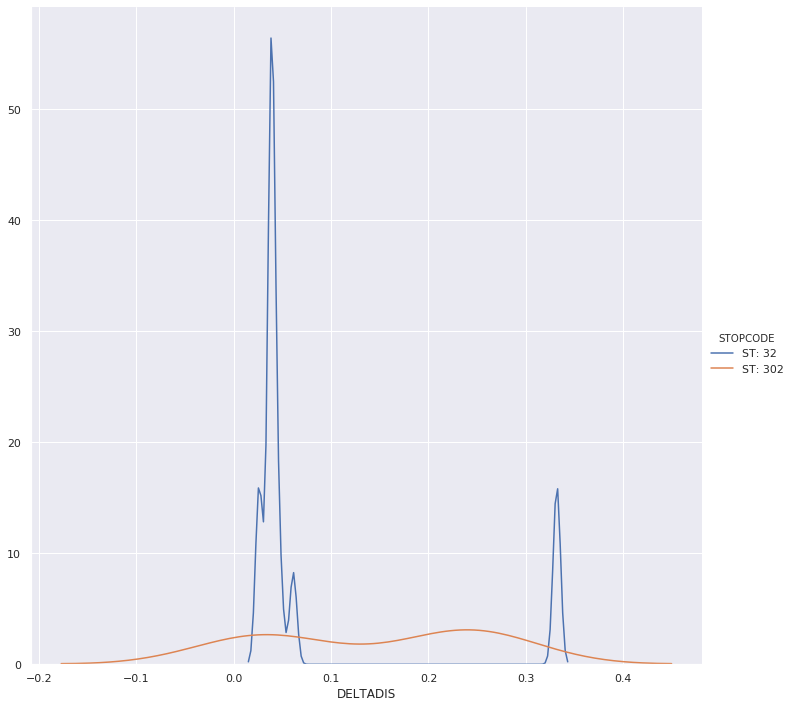

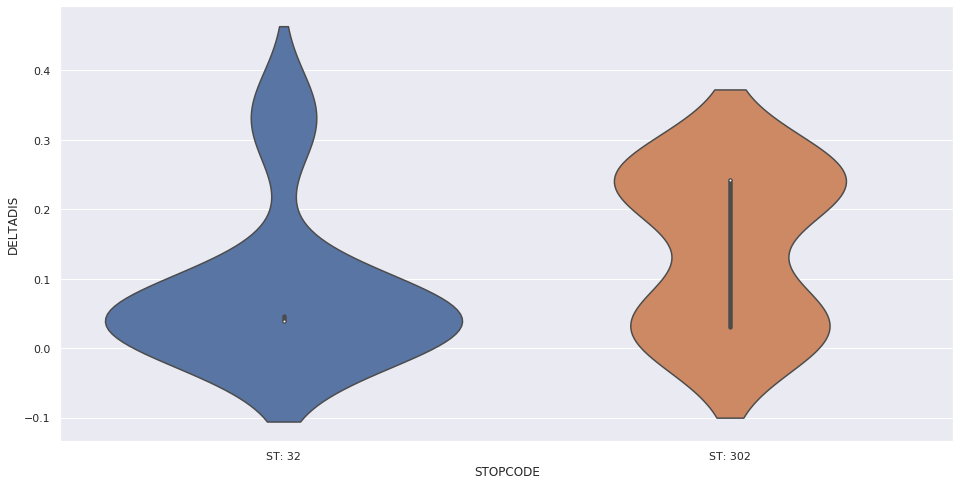

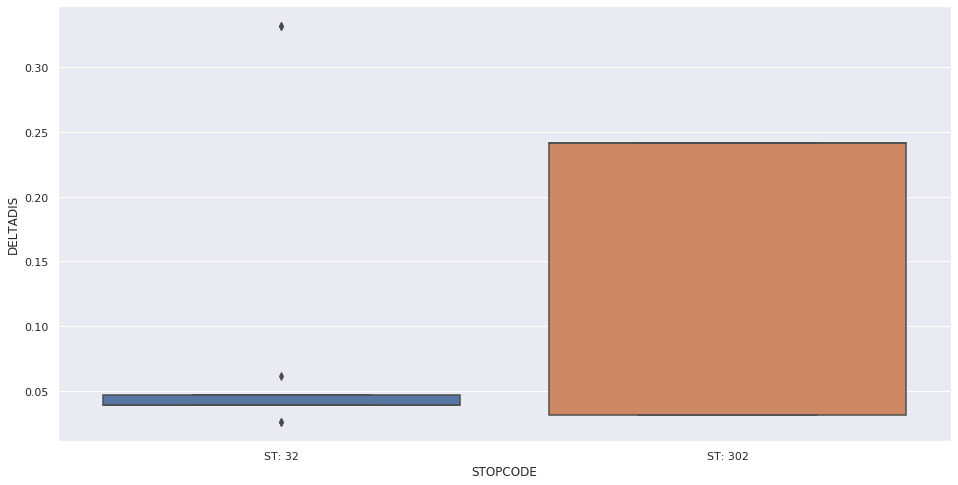

In [608]:
# Plot theo stop
#example_stop_list = stops_df.STOPID.value_counts().sort_values(ascending=False).index[52:54].tolist()
example_stop_list = [32, 302]
example_stop_plot = stops_df[stops_df.STOPID.isin(example_stop_list)].copy()
example_stop_plot["STOPCODE"] = "ST: " + example_stop_plot.STOPID.astype("str")
example_stop_plot = example_stop_plot.query("DELTADIS > 0").copy()

# Multi KDE
grid = sns.FacetGrid(example_stop_plot, hue="STOPCODE", height=10)
grid.map(sns.kdeplot, "DELTADIS")
grid.add_legend()
plt.show()

# Plot kde of DELTADIS
fig, ax = plt.subplots(figsize=(16, 8))
sns.violinplot(y="DELTADIS", x="STOPCODE", ax=ax, data=example_stop_plot)
plt.show()

# Plot kde of DELTADIS
fig, ax = plt.subplots(figsize=(16, 8))
sns.boxplot(y="DELTADIS", x="STOPCODE", ax=ax, data=example_stop_plot)
plt.show()

Số ROUTE & ROUTEVAR đi qua Stop

In [610]:
no_rtstop = stops_df.groupby("STOPID").agg(NOROUTEVAR= ("STOPID", "size")).sort_values("NOROUTEVAR", ascending=False).reset_index()

no_rtstop.head(2)

,STOPID,NOROUTEVAR
0,35,52
1,8,29


In [611]:
no_rtstop.query("STOPID==7276")

,STOPID,NOROUTEVAR
5,7276,22


In [634]:
!ls /data/ebms/feed/businfo/2020/03/16

paths.json	     prediction_11h.json  prediction_19h.json
prediction_04h.json  prediction_12h.json  prediction_20h.json
prediction_05h.json  prediction_13h.json  prediction_21h.json
prediction_06h.json  prediction_14h.json  routes.json
prediction_07h.json  prediction_15h.json  stops.json
prediction_08h.json  prediction_16h.json  timetables.json
prediction_09h.json  prediction_17h.json  trips.json
prediction_10h.json  prediction_18h.json  vars.json


In [636]:
!cp -r /data/ebms/feed/businfo/2020/03/16/* ../data/raw/20200316/